# Loading the data

In [1]:
# imports and Drive mounting
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

print(tf.__version__)

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import sklearn as sk
import pandas as pd
from pandas import read_csv
from datetime import datetime
import math
import os

# fix random seed for reproducibility
seed = 2020
np.random.seed(seed)

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

from tensorflow.keras.datasets import cifar100
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D
from tensorflow.keras.layers import LSTM, GRU
from tensorflow.keras.regularizers import L1L2
from tensorflow.keras.constraints import max_norm
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras import optimizers
from tensorflow.keras import Input
from tensorflow.keras.models import Model
from tensorflow.keras.constraints import MaxNorm

TensorFlow 2.x selected.
2.1.0


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

!ls '/content/gdrive/My Drive/Colab Notebooks/DL2020/GA3/'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
checkpoints			 preprocessed_train_data_all.csv
pollution_data.csv		 preprocessed_train_data.csv
preprocessed_pollution_data.csv  preprocessed_val_data.csv
preprocessed_test_data.csv


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f38f9c45240>,
      dtype=object)

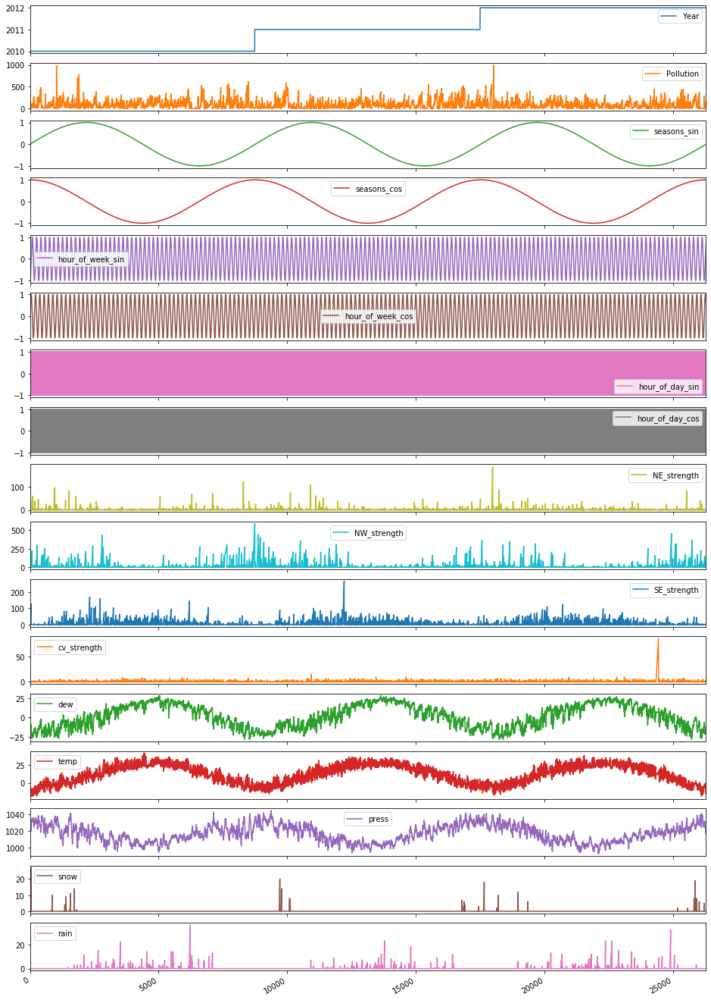

In [3]:
# load dataset

# this code only loads train and test datasets

# remember you also need to split off a validation dataset
# either by reusing and adapting the splitting code from the preprocessing notebook 
# or by writing your own code
# like in the previous assignments, this means you should have 4 sets:

# train_all (train+validate), train, validate and test

# The PATH setting below assumes you just uploaded the data file to your Colab session
# When using Drive: replace this by the path where you put the data file
DATAPATH = '/content/gdrive/My Drive/Colab Notebooks/DL2020/GA3/'
TRAINDATAALLFILE = DATAPATH+'preprocessed_train_data_all.csv'
TRAINDATAFILE = DATAPATH+'preprocessed_train_data.csv'
VALDATAFILE = DATAPATH+'preprocessed_val_data.csv'
TESTDATAFILE = DATAPATH+'preprocessed_test_data.csv'

train_all_dataset = read_csv(TRAINDATAALLFILE, header=0, index_col=0)
train_dataset = read_csv(TRAINDATAFILE, header=0, index_col=0)
val_dataset = read_csv(VALDATAFILE, header=0, index_col=0)
test_dataset = read_csv(TESTDATAFILE, header=0, index_col=0)

#check - note that you can make many other plots directly from pandas dataframes:
# https://pandas.pydata.org/pandas-docs/version/0.16/visualization.html
train_dataset.plot(subplots=True,figsize=(16,26))

## Extract train, validate and test features and labels

In the code below, we will split of an arbitrary number of 5000 samples at the end of the training set as validation data. It is up to you to decide how much data you split off.# New Section

In [4]:
# extract data from dataframes, selecting the features you want
# note that the labels simply contain the pollution data for now
# depending on the window sizes used in training, the correct values will be cut out
features = np.arange(1,17)
pollution = 1

# Important: Tensorflow 2.x gives an error if you omit
# the np.asarray(...,,dtype=np.float32)
train_all_values = np.asarray(train_all_dataset.values[:,features],dtype=np.float32)
train_all_labels = np.asarray(train_all_dataset.values[:,pollution],dtype=np.float32)
train_values = np.asarray(train_dataset.values[:,features],dtype=np.float32)
train_labels = np.asarray(train_dataset.values[:,pollution],dtype=np.float32)
val_values = np.asarray(val_dataset.values[:,features],dtype=np.float32)
val_labels = np.asarray(val_dataset.values[:,pollution],dtype=np.float32)
test_values = np.asarray(test_dataset.values[:,features],dtype=np.float32)
test_labels = np.asarray(test_dataset.values[:,pollution],dtype=np.float32)

print(train_all_values.shape)
print(train_all_labels.shape)
print(train_values.shape)
print(train_labels.shape)
print(val_values.shape)
print(val_labels.shape)
print(test_values.shape)
print(test_labels.shape)

(35040, 16)
(35040,)
(26280, 16)
(26280,)
(8760, 16)
(8760,)
(8760, 16)
(8760,)


## Normalising the data

As you know by now, it is important to normalise the data. The flow is the following:

- initialise normaliser 1
- fit on training date
- use it to transform train and validation data

For your final model(s) you need a second normaliser:
- initialise normaliser 2
- fit on training+validation data
- use it to transform training+validation and test data

This has to be done **before** reformatting the data into windows (next section). 

Although we already did this before, the code below gives an example (adapt the code after you've defined a validation set:

In [5]:
# imports to show that there are many different scalers
# especially with recurrent NNs, the choice of scaler can make a difference
# look up what they do before choosing which one to try
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.preprocessing import MaxAbsScaler
# from sklearn.preprocessing import RobustScaler
# from sklearn.preprocessing import Normalizer # BAD for this case
# from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer # BEST for this case

# Example: train standard scalers, apply to train and test data
# adapt to do all you need to do ...
SS1 = PowerTransformer()
SS1.fit(train_values)

train_scaled = SS1.transform(train_values)
val_scaled = SS1.transform(val_values)

SS2 = PowerTransformer()
SS2.fit(train_all_values)

train_all_scaled = SS2.transform(train_all_values)
test_scaled = SS2.transform(test_values)

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


(26274, 16)
(26274,)
(35034, 16)
(35034,)


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f398039fb38>,
      dtype=object)

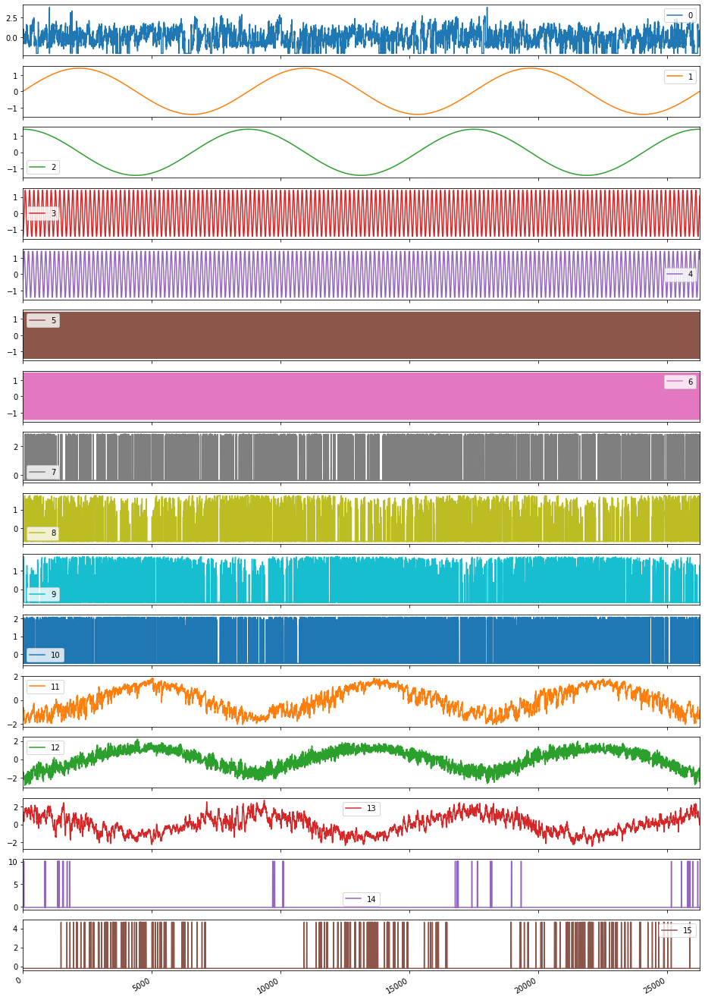

In [6]:
# dense network:
# here you only need to take into account that we are predicting 6 steps ahead
# this means that the features of the first timestep (index 0)
# are used to predict the 7th pollution value (index 6) so the first 6 and the last 6 feature-samples labels are omitted
def create_dataset_dense(train, test, ahead=6): # can use this with different 'ahead' values, but default is set to 6
    return train[:-ahead,:], test[ahead:]

X_train_d,r_train_d = create_dataset_dense(train_scaled,train_labels)
X_val_d,r_val_d = create_dataset_dense(val_scaled,val_labels)
print(X_train_d.shape)
print(r_train_d.shape)

X_train_all_d,r_train_all_d = create_dataset_dense(train_all_scaled,train_all_labels)
X_test_d,r_test_d = create_dataset_dense(test_scaled,test_labels)
print(X_train_all_d.shape)
print(r_train_all_d.shape)

pd.DataFrame(train_scaled).plot(subplots=True,figsize=(16,26))

In [7]:
# window-based and recurrent networks:
# now, you use a window of k history values to predict
# this means that the features of the first k timesteps (indices 0 to k-1)
# are used to predict the k+6th pollution value (index k+6-1)
# output dimension of train data is samples x window x features
def create_dataset_windowed(train, test, ahead=6, window_size=1):
  samples = train.shape[0]-ahead-(window_size-1) 
  dataX= []
  for i in range(samples):
      a = train[i:(i+window_size), :]
      dataX.append(a)
  return np.array(dataX), test[ahead+window_size-1:]

WINDOW=24
X_train_w,r_train_w = create_dataset_windowed(train_scaled,train_labels, window_size=WINDOW)
X_val_w,r_val_w = create_dataset_windowed(val_scaled,val_labels, window_size=WINDOW)

X_train_all_w,r_train_all_w = create_dataset_windowed(train_all_scaled,train_all_labels, window_size=WINDOW)
X_test_w,r_test_w = create_dataset_windowed(test_scaled,test_labels, window_size=WINDOW)

print(X_train_w.shape)
print(r_train_w.shape)

(26251, 24, 16)
(26251,)


## Help functions

In [0]:
def plot_history(history):
  plt.figure(figsize=(6,4))
  
  plt.xlabel('Epoch')
  plt.ylabel('Mae')
  plt.plot(history.epoch, np.array(history.history['mae']),'g-',
           label='Train MAE')
  try:
    plt.plot(history.epoch, np.array(history.history['val_mae']),'r-',
             label = 'Validation MAE')
  except:
    pass
  plt.legend()
  plt.show()

def PlotResults(labels,predictions,binsize=10):
  num_samples = len(labels)
  
  fig = plt.figure(figsize=(16,16))
  spec = gridspec.GridSpec(ncols=4, nrows=4, figure=fig)
  ax1 = fig.add_subplot(spec[0, :])
  ax2 = fig.add_subplot(spec[1, :])
  ax3 = fig.add_subplot(spec[2:,0:2])
  ax4 = fig.add_subplot(spec[2:,2:])
  
  ax1.plot(labels,'k-',label='Labels')
  ax1.plot(predictions,'r-',label='Predictions')
  ax1.set_ylabel('Pollution')
  ax1.legend()
  
  errors=np.absolute(labels-predictions)
  ax2.plot(errors,'k-')
  ax2.set_ylabel("Absolute error")
  
  ax3.scatter(labels,predictions)
  ax3.set_xlabel('Labels')
  ax3.set_ylabel('Predictions')

  bins = np.arange(0,(np.ceil(np.max(errors)/binsize)+1)*binsize,binsize)
  
  ax4.hist(errors,bins=bins)
  ax4.set_xlabel('Absolute error')
  ax4.set_ylabel('Frequency')

  plt.show()

# Step 1

In [0]:
# Train a Dense network on the scaled features
def dense_model(learning_rate=0.01, hidden=[256,1024,1024,128], dropouts=[0.5,0.5,0.5,0.1]):
  # create linear model
  model = Sequential()
  model.add(Dense(hidden[0], kernel_initializer='he_uniform', input_shape=(train_scaled.shape[1],)))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(Dropout(dropouts[0]))

  for idx in range(1, len(hidden)):
    model.add(Dense(hidden[idx], kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dropout(dropouts[idx]))
  
  model.add(Dense(1))
  model.add(BatchNormalization())
  model.add(Activation('linear'))
  # no dropout at the end
  
  optim = tf.keras.optimizers.Adam(lr=learning_rate)
  model.compile(loss='mae',
                optimizer=optim,
                # keep extra metrics: mse and mae without regularisation terms
                metrics=['mse', 'mae'])
  return model

model = dense_model()
model.summary()

batch_size = 5*168
epochs = 70

# cp_path = '/content/gdrive/My Drive/Colab Notebooks/DL2020/GA3/checkpoints/step_1/cp.ckpt'
# cp_callback = tf.keras.callbacks.ModelCheckpoint(cp_path,
#                                                  monitor='val_mae',
#                                                  verbose=1,
#                                                  save_best_only=True,
#                                                  save_weights_only=True)
# lr_callback = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_mae',
#                                                    factor=0.9,
#                                                    patience=5,
#                                                    verbose=1,
#                                                    min_lr=0.0001)

# history = model.fit(X_train_d,
#                     r_train_d,
#                     shuffle=True,
#                     batch_size=batch_size,
#                     epochs=epochs,
#                     validation_data=(X_val_d,r_val_d),
#                     callbacks=[cp_callback, lr_callback])

# model.load_weights(cp_path)

history = model.fit(X_train_all_d,
                    r_train_all_d,
                    shuffle=True,
                    batch_size=batch_size,
                    epochs=epochs)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               4352      
_________________________________________________________________
batch_normalization (BatchNo (None, 256)               1024      
_________________________________________________________________
activation (Activation)      (None, 256)               0         
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              263168    
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024)              4096      
_________________________________________________________________
activation_1 (Activation)    (None, 1024)              0

NameError: ignored

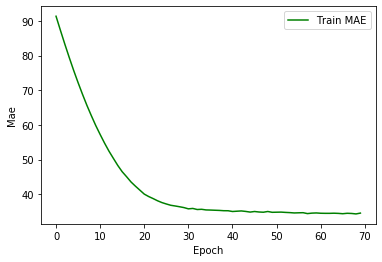

"Current pollution" baseline:
 train_all mae =  32.11586 
 test mae =  34.71713
(35034, 1)
(8754, 1)


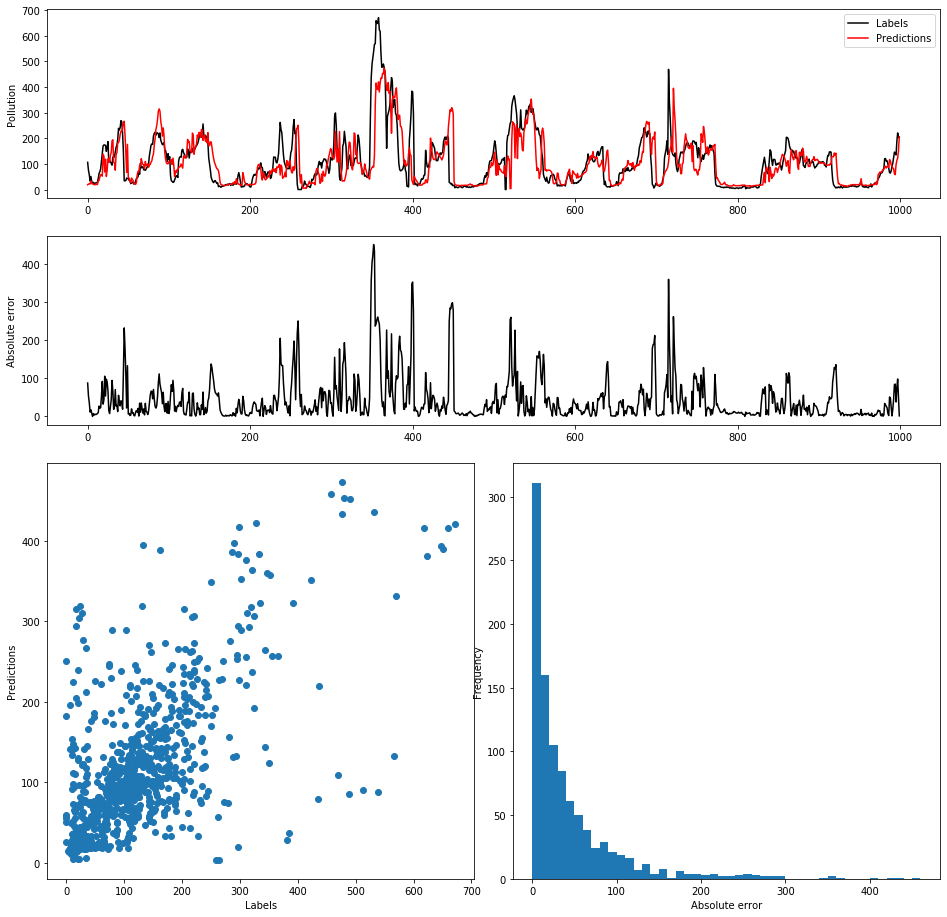

In [0]:
plot_history(history)

# y_train = model.predict(X_train_d)
# y_val = model.predict(X_val_d)
y_train_all = model.predict(X_train_all_d)
y_test = model.predict(X_test_d)

# mae_train = mean_absolute_error(r_train_d,y_train)
# mae_val = mean_absolute_error(r_val_d,y_val)
mae_train_all = mean_absolute_error(r_train_all_d,y_train_all)
mae_test = mean_absolute_error(r_test_d,y_test)

# print("\"Current pollution\" baseline:\n train mae = ",mae_train,
#       "\n validation mae = ",mae_val)
print("\"Current pollution\" baseline:\n train_all mae = ",mae_train_all,
      "\n test mae = ",mae_test)

# print(y_train.shape)
# print(y_val.shape)
print(y_train_all.shape)
print(y_test.shape)

# Visualise first 1000 predictions for validation and test
# PlotResults(r_val_d[:1000],y_val[:1000,0])
PlotResults(r_test_d[:1000],y_test[:1000,0])

## LIME

In [0]:
!pip install lime

In [0]:
# predictions = model.predict(X_val_d)
# r_val_d_T = np.transpose(np.array([r_val_d]))
# mae_val = abs(r_val_d_T-predictions)
# mae_val_partitioned = np.argpartition(mae_val,-5,axis=0)
# largest = mae_val_partitioned[-5:]
# smallest = mae_val_partitioned[:5]
# print(mae_val.shape)
# print(f'Largest mistakes: {mae_val[largest]}')
# print(f'Smallest mistakes: {mae_val[smallest]}')

predictions = model.predict(X_test_d)
r_test_d_T = np.transpose(np.array([r_test_d]))
mae_test = abs(r_test_d_T-predictions)
mae_test_partitioned = np.argpartition(mae_test,-5,axis=0)
largest = mae_test_partitioned[-5:]
smallest = mae_test_partitioned[:5]
print(mae_test.shape)
print(f'Largest mistakes: {mae_test[largest]}')
print(f'Smallest mistakes: {mae_test[smallest]}')

(8754, 1)
Largest mistakes: [[[422.67407]]

 [[434.46906]]

 [[529.64716]]

 [[451.46228]]

 [[451.54083]]]
Smallest mistakes: [[[ 3.015396 ]]

 [[ 4.6100426]]

 [[ 9.137653 ]]

 [[11.382488 ]]

 [[ 9.536522 ]]]


In [0]:
import lime
import lime.lime_tabular

feature_names = ['Pollution',
                 'seasons_sin',
                 'seasons_cos',
                 'hour_of_week_sin',
                 'hour_of_week_cos',
                 'hour_of_day_sin',
                 'hour_of_day_cos',
                 'NE_strength',
                 'NW_strength',
                 'SE_strength',
                 'cv_strength',
                 'dew',
                 'temp',
                 'press',
                 'snow',
                 'rain']

explainer = lime.lime_tabular.LimeTabularExplainer(train_scaled, feature_names=feature_names, class_names=['Pollution'], verbose=True, mode='regression')

In [0]:
# Explain largest and smallest mistakes
print('Largest mistakes:')
for i in largest:
  print(f'Correct pollution: {r_val_d[i]}')
  exp = explainer.explain_instance(X_val_d[i[0]], model.predict, num_features=5, num_samples=5000)
  exp.show_in_notebook(show_table=False)
  exp.score

print('Smallest mistakes:')
for i in smallest:
  print(f'Correct pollution: {r_val_d[i]}')
  exp = explainer.explain_instance(X_val_d[i[0]], model.predict, num_features=5, num_samples=5000)
  exp.show_in_notebook(show_table=False)
  exp.score

Largest mistakes:
Correct pollution: [341.]
Intercept 24.521626130115123
Prediction_local [111.98152789]
Right: 271.0736


Correct pollution: [227.]
Intercept 15.603161571487604
Prediction_local [132.33509597]
Right: 158.59723


Correct pollution: [14.]
Intercept 64.7337485995023
Prediction_local [-7.89648166]
Right: 19.737793


Correct pollution: [201.]
Intercept 31.14733632548145
Prediction_local [90.18936706]
Right: 181.12793


Correct pollution: [370.]
Intercept 14.73966372168961
Prediction_local [103.73970269]
Right: 282.50903


Smallest mistakes:
Correct pollution: [229.]
Intercept 44.55891892287824
Prediction_local [51.83012054]
Right: 112.31386


Correct pollution: [23.]
Intercept 67.84995747709148
Prediction_local [0.44613578]
Right: 41.37831


Correct pollution: [20.]
Intercept 62.543220812177076
Prediction_local [-6.50975143]
Right: 30.419308


Correct pollution: [14.]
Intercept 67.54315461901739
Prediction_local [0.88989818]
Right: 25.021687


Correct pollution: [23.]
Intercept 70.98533771900534
Prediction_local [-6.18487959]
Right: 31.607147


# Step 2

## Window-based CNN

In [0]:
# current code for pollution-only, add other features for multi-feature model, 
# remove indices as in commented code if you want to use all features
train_features = [0,]

CNN_WINDOW_SIZE=168
ahead=6

# Apply trend removal
# Differentiate by subtracting current pollution value from future pollution value in labels
# X_train_w,r_train_w = create_dataset_windowed(train_scaled[:,train_features], train_labels, window_size=CNN_WINDOW_SIZE)
# # r_train_w -= train_labels[CNN_WINDOW_SIZE-1:-ahead]
# X_val_w,r_val_w = create_dataset_windowed(val_scaled[:,train_features], val_labels, window_size=CNN_WINDOW_SIZE)
# # r_val_w -= val_labels[CNN_WINDOW_SIZE-1:-ahead]
X_train_all_w,r_train_all_w = create_dataset_windowed(train_all_scaled[:,train_features],train_all_labels, window_size=CNN_WINDOW_SIZE)
# r_train_all_w -= train_all_labels[CNN_WINDOW_SIZE-1:-ahead]
X_test_w,r_test_w = create_dataset_windowed(test_scaled[:,train_features],test_labels, window_size=CNN_WINDOW_SIZE)
# r_test_w -= test_labels[CNN_WINDOW_SIZE-1:-ahead]

def conv_model(CNN_WINDOW_SIZE=24, learning_rate=0.01, hidden=[64,128,256]):
  model = Sequential()
  
  model.add(Conv1D(filters=hidden[0],
                      kernel_size=2,
                      padding='same',
                      kernel_initializer='he_uniform',
                      input_shape=(CNN_WINDOW_SIZE,len(train_features))))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(MaxPooling1D(pool_size=2))

  for idx in range(1, len(hidden)):
    model.add(Conv1D(filters=hidden[idx],
                        kernel_size=2,
                        padding='same',
                        kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling1D(pool_size=2))

  model.add(Flatten())
  model.add(Dense(1, kernel_initializer='glorot_uniform'))
  model.add(Activation('linear'))

  optim = tf.keras.optimizers.Adam(lr=learning_rate)
  model.compile(loss='mae',
                optimizer=optim,
                # keep extra metrics: mse and mae without regularisation terms
                metrics=['mse', 'mae'])

  return model

In [10]:
batch_size = 8*168 # 8 weeks
epochs = 30
learning_rate = 0.001

model = conv_model(CNN_WINDOW_SIZE=CNN_WINDOW_SIZE, learning_rate=learning_rate, hidden=[64,128,256])
model.summary()

# cp_path = '/content/gdrive/My Drive/Colab Notebooks/DL2020/GA3/checkpoints/step_2/cp.ckpt'
# cp_callback = tf.keras.callbacks.ModelCheckpoint(cp_path,
#                                                  monitor='val_mae',
#                                                  verbose=1,
#                                                  save_best_only=True,
#                                                  save_weights_only=True)

# history = model.fit(X_train_w, r_train_w,
#                     shuffle=True,
#                     batch_size=batch_size,
#                     epochs=epochs,
#                     validation_data=(X_val_w,r_val_w),
#                     callbacks=[cp_callback])
# model.load_weights(cp_path)

history = model.fit(X_train_all_w,
                    r_train_all_w,
                    shuffle=True,
                    batch_size=batch_size,
                    epochs=epochs)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 168, 64)           192       
_________________________________________________________________
batch_normalization (BatchNo (None, 168, 64)           256       
_________________________________________________________________
activation (Activation)      (None, 168, 64)           0         
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 84, 64)            0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 84, 128)           16512     
_________________________________________________________________
batch_normalization_1 (Batch (None, 84, 128)           512       
_________________________________________________________________
activation_1 (Activation)    (None, 84, 128)           0

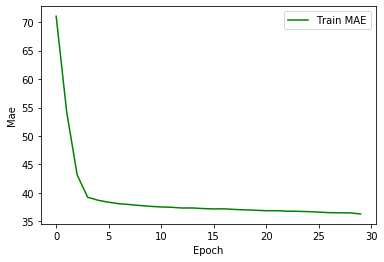

"Current pollution" baseline:
 train_all mae =  36.290863 
 test mae =  37.04023
(34867, 1)
(8587, 1)


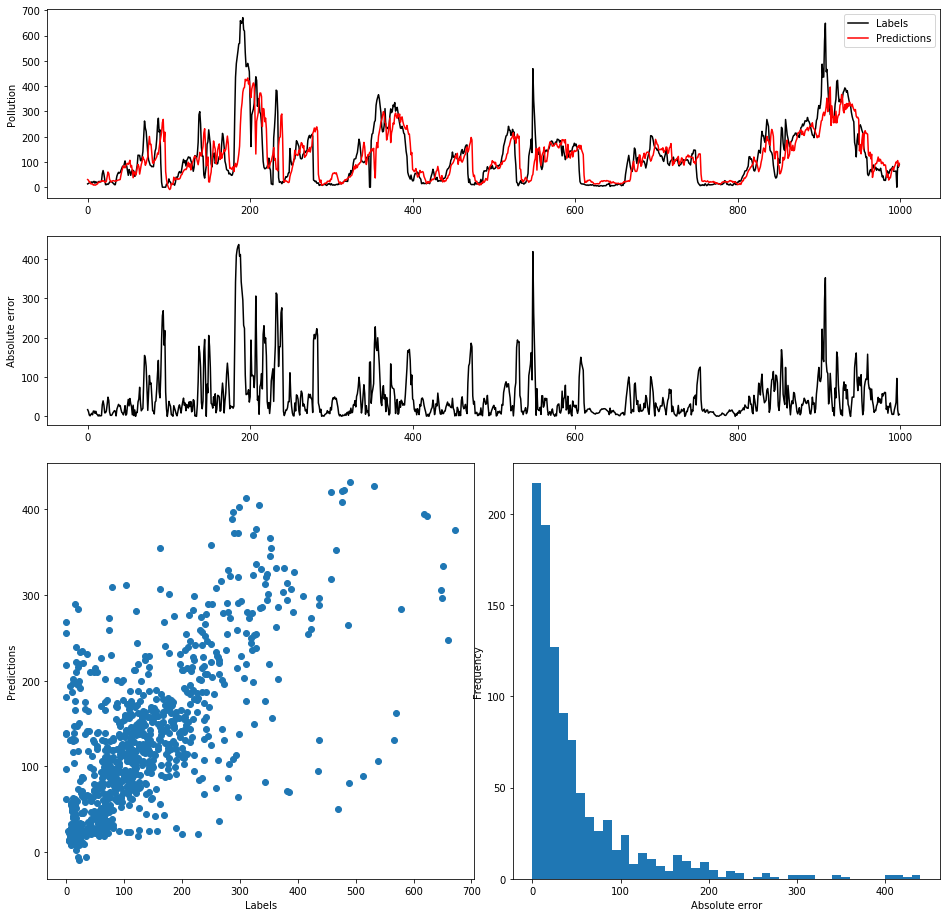

In [11]:
plot_history(history)

# y_train = model.predict(X_train_w)
# y_val = model.predict(X_val_w)
y_train_all = model.predict(X_train_all_w)
y_test = model.predict(X_test_w)

# mae_train = mean_absolute_error(r_train_w,y_train)
# mae_val = mean_absolute_error(r_val_w,y_val)
mae_train_all = mean_absolute_error(r_train_all_w,y_train_all)
mae_test = mean_absolute_error(r_test_w,y_test)

# print("\"Current pollution\" baseline:\n train mae = ",mae_train,
#       "\n validation mae = ",mae_val)
print("\"Current pollution\" baseline:\n train_all mae = ",mae_train_all,
      "\n test mae = ",mae_test)

# print(y_train.shape)
# print(y_val.shape)
print(y_train_all.shape)
print(y_test.shape)

# Visualise first 1000 predictions for validation and test
# PlotResults(r_val_w[:1000],y_val[:1000,0])
PlotResults(r_test_w[:1000],y_test[:1000,0])

## LSTM/GRU

# Step 3

# Step 4